In [1]:
import os
from functools import partial

import numpy as np
import imageio.v3 as iio
import matplotlib.pyplot as plt
import skimage.transform as T

resource_folder = './resources/tiff'
image_size = 6

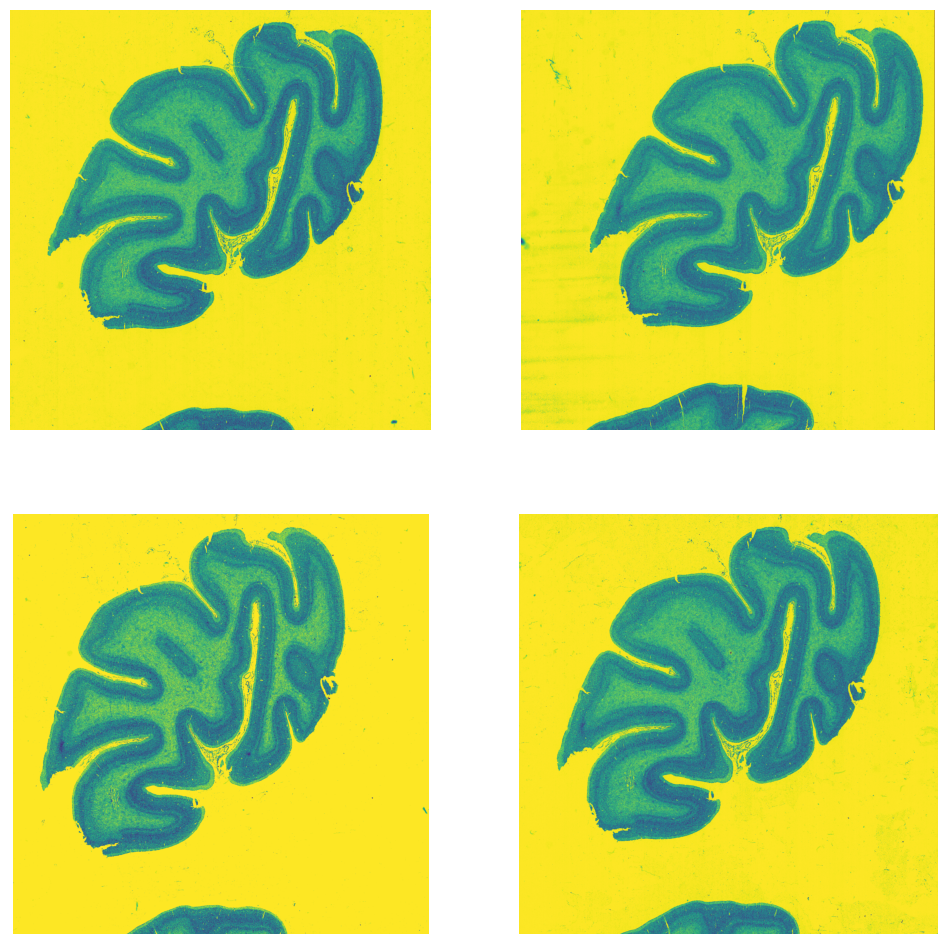

In [2]:
def read_images(path):
    return [iio.imread(os.path.join(path, file)) for file in os.listdir(path)]


images = read_images(resource_folder)

_, axes = plt.subplots(2, 2, figsize=(2 * image_size, 2 * image_size))
for image, ax in zip(images[:4], axes.flatten()):
    ax.imshow(image)
    ax.axis('off')
plt.show()

In [3]:
images = np.array([np.pad(image[:1600, :1599], ((0, 0), (0, 1)), mode='edge') for image in images])
images.shape

(27, 1600, 1600)

In [4]:
assert np.allclose(images, images.astype(np.uint8), atol=1e-3)
images = images.astype(np.uint8)

## Task 1: Downsampling

In [5]:
def downsample(image, factor: int = 2):
    assert factor > 0, "Factor must be greater than 0"
    assert image.shape[0] % factor == 0 and image.shape[1] % factor == 0, "Image dimensions must be divisible by factor"

    target = np.zeros((image.shape[0] // factor, image.shape[1] // factor))
    for i in range(0, image.shape[0], factor):
        for j in range(0, image.shape[1], factor):
            target[i // factor, j // factor] = np.mean(image[i:i + factor, j:j + factor], axis=(0, 1))
    return target.round().astype(np.uint8)

In [6]:
img1, img2 = images[0], images[20]

In [7]:
assert np.allclose(T.downscale_local_mean(images[0], 2), downsample(images[0], 2), atol=1)

In [8]:
def test_downsampling(image):
    return [image, downsample(image, 2), downsample(image, 8), downsample(image, 32)]


downsampled_imgs = test_downsampling(img1) + test_downsampling(img2)

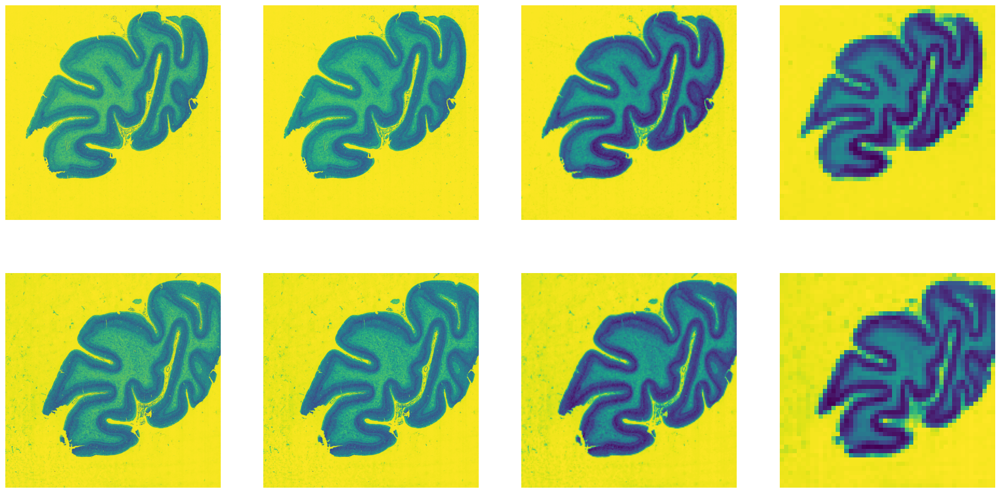

In [9]:
def show_downsampled_images(imgs):
    _, axes = plt.subplots(2, 4, figsize=(4 * image_size, 2 * image_size))
    for image, ax in zip(imgs, axes.flatten()):
        ax.imshow(image)
        ax.axis('off')
    plt.show()


show_downsampled_images(downsampled_imgs)

## Task 2: Histogram Equalization

In [10]:
def histogram_equalization(image):
    counts = np.zeros(256)

    vals, unique_counts = np.unique(image, return_counts=True)
    counts[vals] = unique_counts

    cdf = np.cumsum(counts)
    rel_cdf = cdf / cdf[-1]

    he_map = np.round(255 * rel_cdf).astype(np.uint8)
    return he_map[image], he_map

In [11]:
dimg1 = downsample(img1)
dimg2 = downsample(img2)

he_dimg1, he_map1 = histogram_equalization(dimg1)
he_dimg2, he_map2 = histogram_equalization(dimg2)

he_dimgs = np.array([dimg1, he_dimg1, dimg2, he_dimg2])

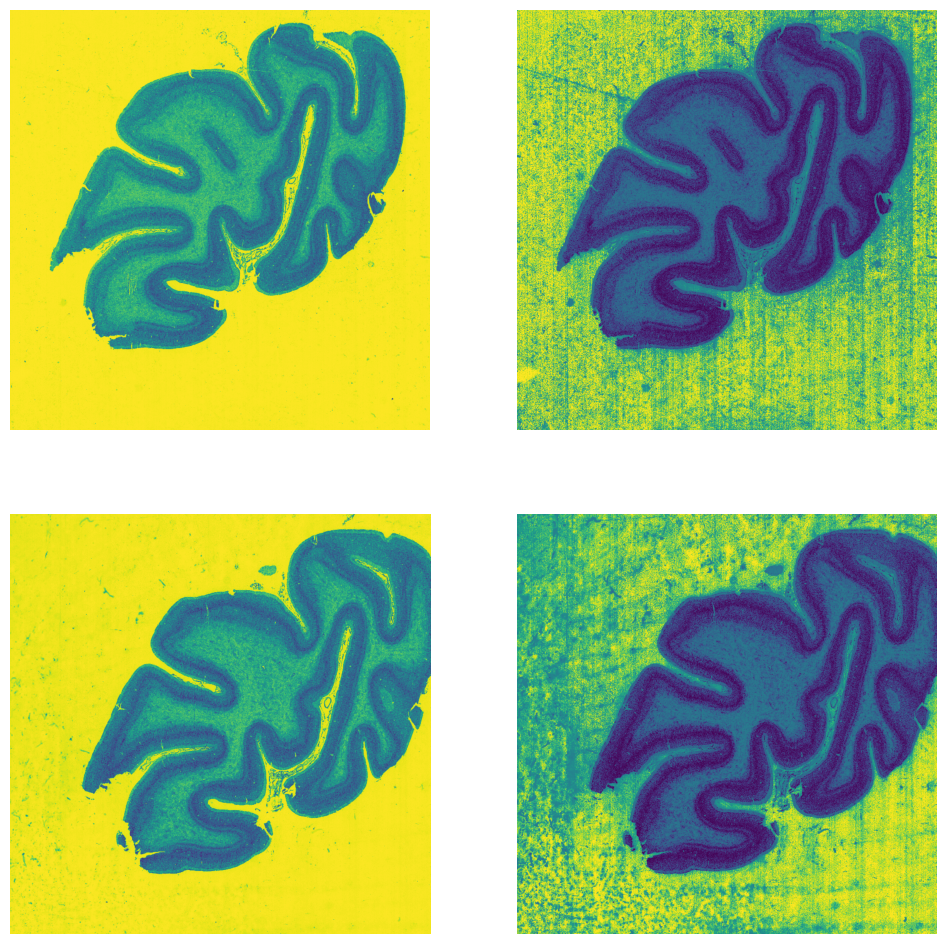

In [12]:
def show_images(imgs):
    _, axes = plt.subplots(2, 2, figsize=(2 * image_size, 2 * image_size))
    for image, ax in zip(imgs, axes.flatten()):
        ax.imshow(image)
        ax.axis('off')
    plt.show()


show_images(he_dimgs)

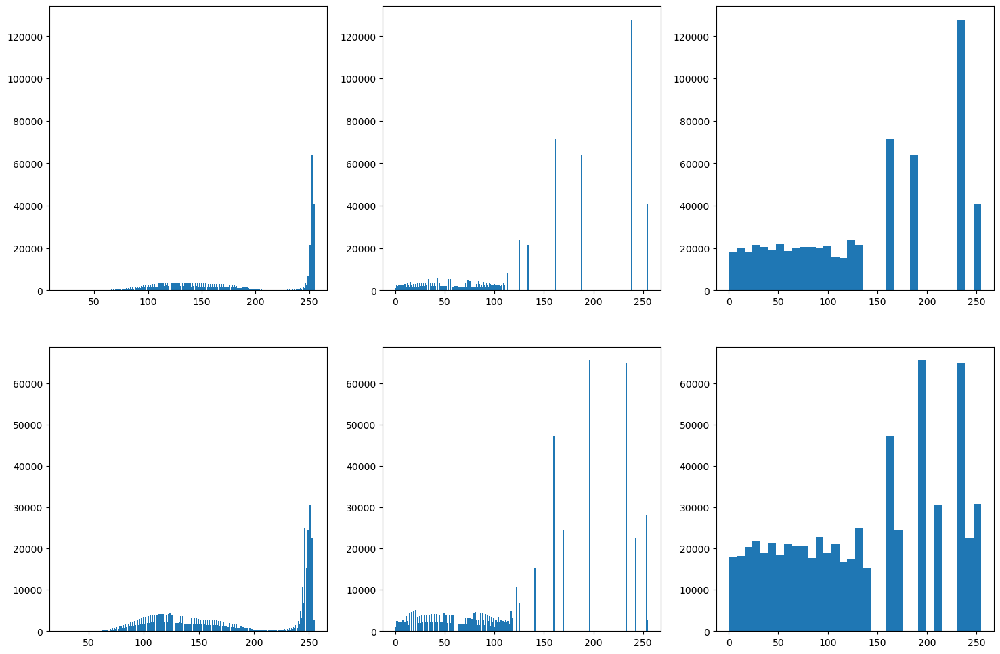

In [13]:
def plot_histograms(imgs):
    _, axes = plt.subplots(2, 3, figsize=(3 * image_size, 2 * image_size))
    for (o_image, he_image), ax in zip(imgs.reshape(2, 2, -1), axes):
        ax[0].hist(o_image, bins=256)
        ax[1].hist(he_image, bins=256)
        ax[2].hist(he_image, bins=32)


plot_histograms(he_dimgs)

In [14]:
# apply hist to original images

he_img1 = he_map1[img1]
he_img2 = he_map2[img2]

he_imgs = np.array([img1, he_img1, img2, he_img2])

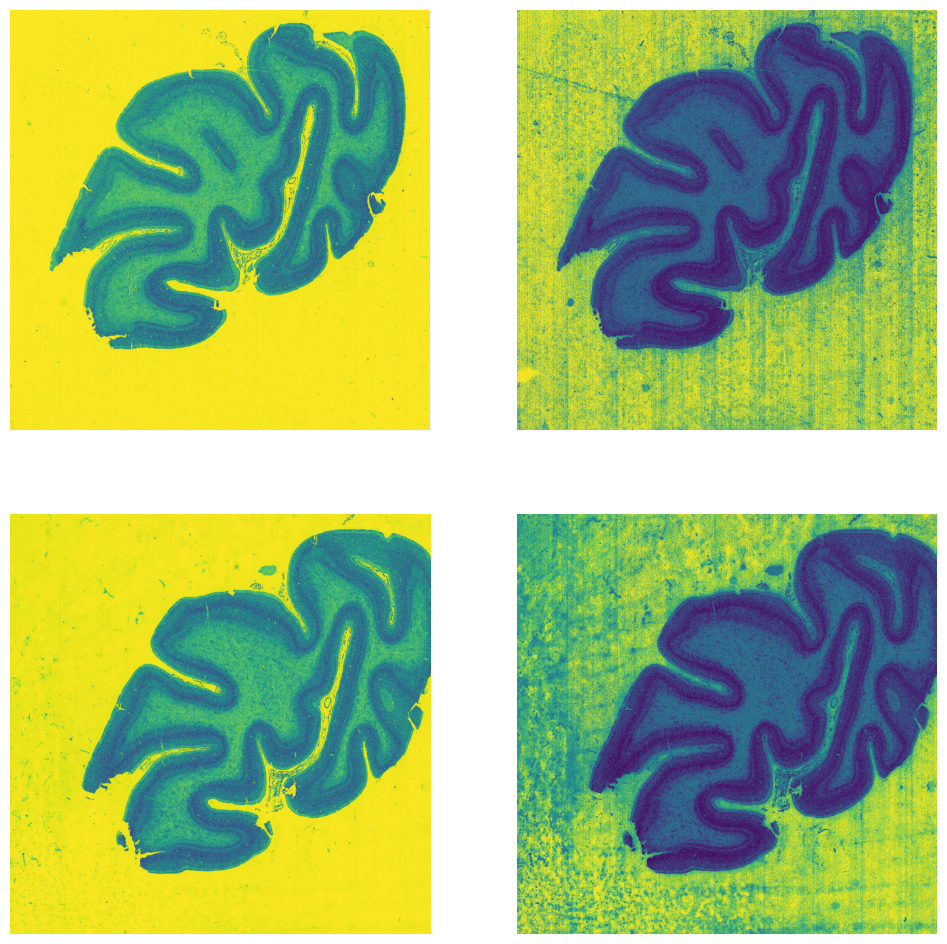

In [15]:
show_images(he_imgs)

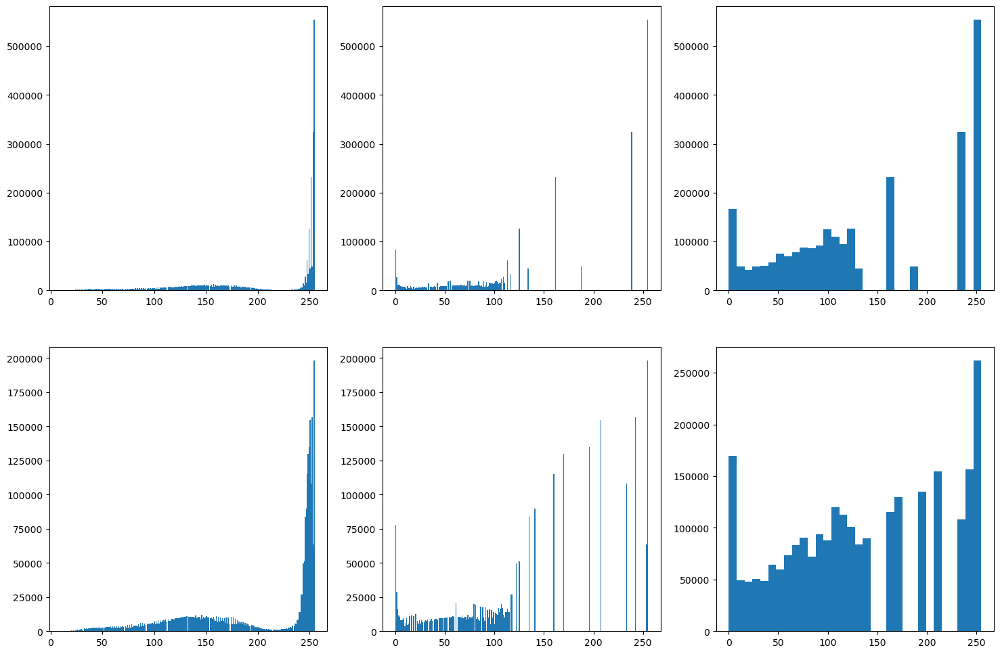

In [16]:
plot_histograms(he_imgs)

## Task 3: Filters

In [17]:
def apply_filter(image, f, kernel_size: int = 3):
    h, w = image.shape
    target = np.zeros((h - kernel_size + 1, w - kernel_size + 1))

    for i in range(h - kernel_size + 1):
        for j in range(w - kernel_size + 1):
            target[i, j] = f(image[i:i + kernel_size, j:j + kernel_size])

    return target.round().astype(np.uint8)

In [18]:
def get_sobel_filter(orientation='horizontal', gamma=4):
    kernel = np.array([[-1, -2, -1], [0, 0, 0], [1, 2, 1]])
    if orientation == 'vertical': kernel = kernel.T

    f = lambda image: np.sum(kernel * image)

    def apply(image):
        result = apply_filter(image, f=f, kernel_size=3).astype(np.float32)
        result = abs(result) ** gamma
        result = (result - result.min()) / (result.max() - result.min())
        return result.round().astype(np.uint8)

    return apply

In [19]:
def get_gaussian_filter(sigma, kernel_size=None):
    if not kernel_size:
        kernel_size = 6 * sigma + 1
    else:
        assert kernel_size % 2 == 1, "Kernel size must be odd"

    xy = np.arange(-kernel_size // 2 + 1, kernel_size // 2 + 1)
    xv, yv = np.meshgrid(xy, xy)
    gaussian = np.exp(-(xv ** 2 + yv ** 2) / (2 * sigma ** 2))
    gaussian_kernel = gaussian / gaussian.sum()
    return partial(apply_filter, f=lambda image: np.sum(gaussian_kernel * image), kernel_size=kernel_size)

In [20]:
mean_filter = partial(apply_filter, f=np.mean)
median_filter = partial(apply_filter, f=np.median)

In [21]:
filtered_funcs = [
    (partial(mean_filter, kernel_size=3), "Mean Filter (KS=3)"),
    (partial(mean_filter, kernel_size=15), "Mean Filter (KS=15)"),
    (partial(median_filter, kernel_size=3), "Median Filter (KS=3)"),
    (partial(median_filter, kernel_size=15), "Median Filter (KS=15)"),
    (get_sobel_filter('horizontal'), "Sobel Filter (Horizontal)"),
    (get_sobel_filter('vertical'), "Sobel Filter (Vertical)"),
    (get_gaussian_filter(1), r"Gaussian Filter ($\sigma=1; KS=5$)"),
    (get_gaussian_filter(3), r"Gaussian Filter ($\sigma=3; KS=15$)")
]

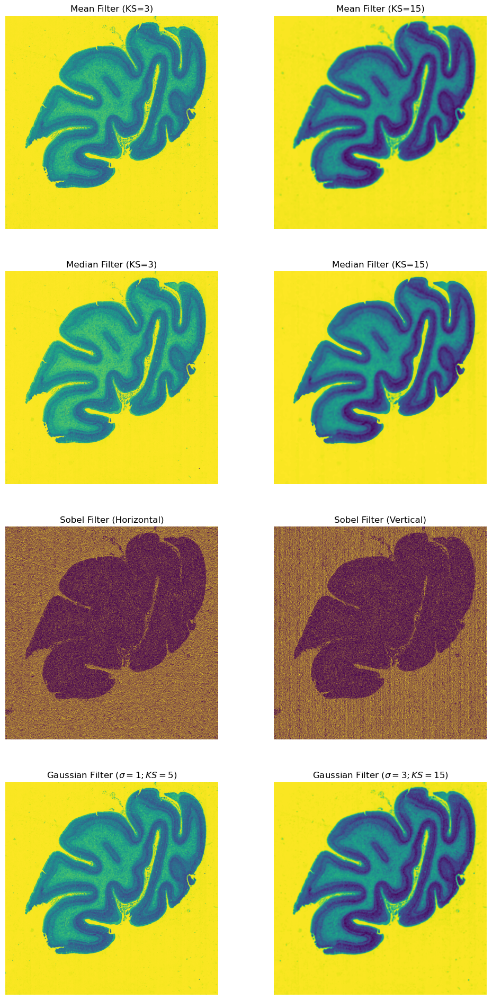

In [22]:
image = img1

_, axes = plt.subplots(4, 2, figsize=(2 * image_size, 4 * image_size))
for (f, title), ax in zip(filtered_funcs, axes.flatten()):
    ax.imshow(f(image))
    ax.set_title(title)
    ax.axis('off')
plt.show()

## Task 4: Gaussian-Downsampling

In [23]:
def gaussian_downsampling(image, factor: int = 2):
    assert factor > 0, "Factor must be greater than 0"

    sigma = np.ceil(factor / 2).astype(int)
    gaussian_k = 6 * sigma + 1
    image = np.pad(image, ((3 * sigma, 3 * sigma), (3 * sigma, 3 * sigma)), mode='edge')

    image = get_gaussian_filter(sigma, gaussian_k)(image)
    return downsample(image, factor)

In [24]:
def test_gaussian_downsampling(image):
    return [image, gaussian_downsampling(image, 2), gaussian_downsampling(image, 8), gaussian_downsampling(image, 32)]


gaussian_downsampled_imgs = test_gaussian_downsampling(img1) + test_gaussian_downsampling(img2)

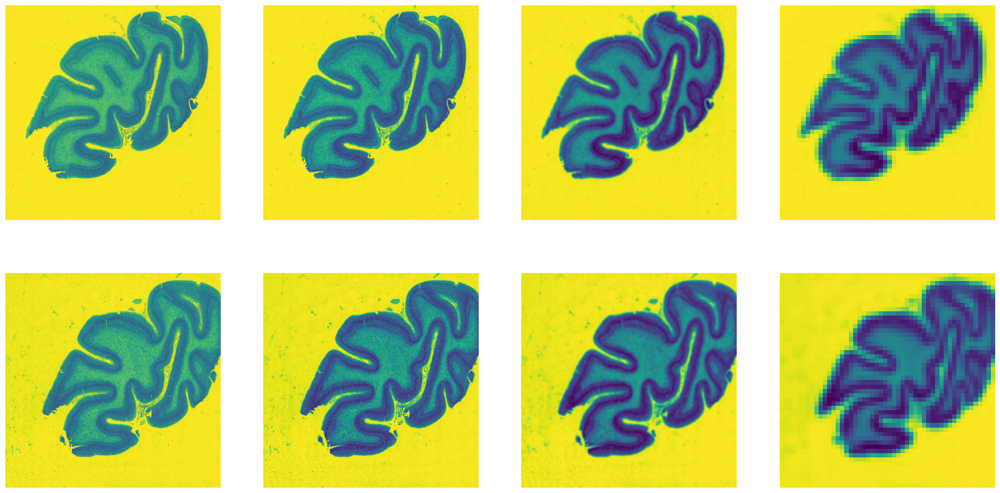

In [25]:
show_downsampled_images(gaussian_downsampled_imgs)

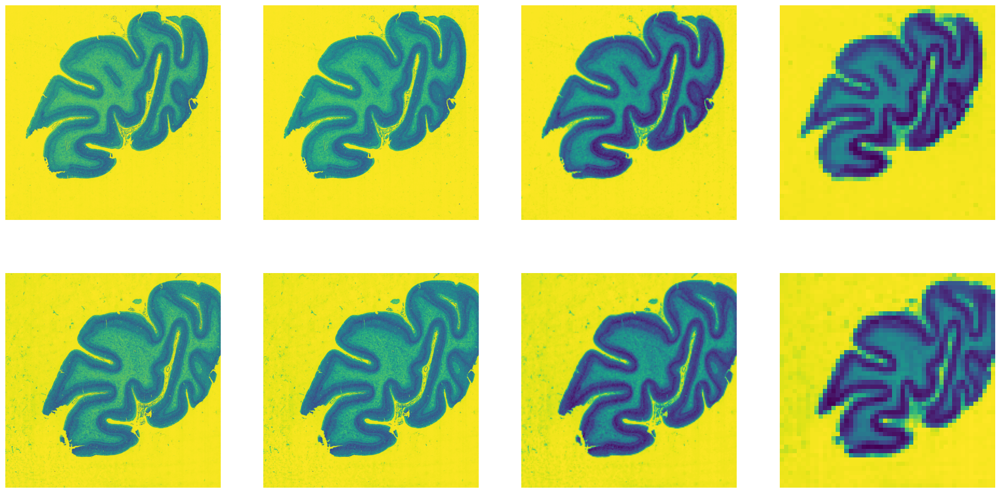

In [26]:
# re-show normal downsampling for comparison
show_downsampled_images(downsampled_imgs)

Except for the border caused by the padding, one can clearly find spots, which are much smoother in the Gaussian version, especially on the high reduction
factor images.